<img src='https://www.actris.eu/sites/default/files/inline-images/Actris%20logo.png' width=200 align=right>

# ACTRIS DC 
## Access ACTRIS ARES data

# OBS THIS DOES NOT WORK RIGHT NOW, UPDATES ARE NEEDED FOR ACTRIS REST API


## Getting Earlinet data
For Earlinet, you should be able to use the ACTRIS api to fetch all the dataset urls. At least for all Earlinet data labeled as ACTRIS.


### ARES unit/Earlinet database
Provider ID 10 is the ARES unit, what you refer to as the Earlinet database 

In [1]:
# import packages
import pandas as pd
import numpy as np 
import requests
import json
import netCDF4 as nc
import xarray as xr

In [2]:
response = requests.get('https://prod-actris-md.nilu.no/Providers/10')
provider_10 = response.json()
provider_10 

[{'id': 10,
  'name': 'ARES',
  'acronym': 'ARES',
  'description': 'ACTRIS Aerosol remote sensing data centre unit (ARES)',
  'created': '2020-06-29T07:05:07.4936990Z'}]

### Getting all Earlinet data
Using the API call below you will get a list of all the datasets with metadata. Fetching the "dataset_url" you should be able to download all the files.

In [3]:
response = requests.get("https://prod-actris-md.nilu.no/Metadata/provider/10") # API call
earlinet_archive = response.json()

In [4]:
earlinet_archive

[{'md_metadata': {'id': 794851,
   'provider_id': 10,
   'file_identifier': 'EARLINET_AerRemSen_evo_Lev02_e0532_201909270159_201909270230_v02_qc03.nc',
   'language': 'en',
   'hierarchy_level': 'dataset',
   'online_resource': {'linkage': 'https://data.earlinet.org/'},
   'datestamp': '2021-06-17T14:33:00.0000000Z',
   'created': '2021-10-05T11:08:28.0000000Z',
   'contact': [{'first_name': 'Daniele',
     'last_name': 'Bortoli',
     'organisation_name': 'Institute for Earth Sciences(ICT-Instituto de Ciencias da Terra)',
     'role_code': ['principalInvestigator'],
     'country_code': 'PT',
     'delivery_point': None,
     'address_city': 'Evora, Portugal',
     'administrative_area': None,
     'postal_code': None,
     'email': 'db@uevora.pt',
     'position_name': 'Senior Scientist'}]},
  'md_identification': {'abstract': 'Profiles of aerosol optical properties',
   'title': 'Ground based LIDAR measurements',
   'date_type': 'creation',
   'contact': [{'first_name': 'Daniele',
 

### All available variables
If you want to list out all the relevant datasets for a give extinction variable you can look at available variables in ACTRIS here (soon it will change following the new ACTRIS vocabulary https://vocabulary.actris.nilu.no/): 

In [5]:
response = requests.get('https://prod-actris-md.nilu.no/ContentInformation/attributes')
contenst = response.json()
contenst

[{'attribute_type': '1-2-3-trimethylbenzene'},
 {'attribute_type': '1-2-4-trimethylbenzene'},
 {'attribute_type': '1-3-5-trimethylbenzene'},
 {'attribute_type': '1-3-butadiene'},
 {'attribute_type': '1-butene'},
 {'attribute_type': '1-butyne'},
 {'attribute_type': '1-hexene'},
 {'attribute_type': '1-pentene'},
 {'attribute_type': '2-2-3-trimethylbutane'},
 {'attribute_type': '2-2-4-trimethylpentane'},
 {'attribute_type': '2-2-dimethylbutane'},
 {'attribute_type': '2-2-dimethylpentane'},
 {'attribute_type': '2-2-dimethylpropane'},
 {'attribute_type': '2-3-dimethylbutane'},
 {'attribute_type': '2-3-dimethylpentane'},
 {'attribute_type': '2-4-dimethylpentane'},
 {'attribute_type': '2-butenal'},
 {'attribute_type': '2-methylbutane'},
 {'attribute_type': '2-methylhexane'},
 {'attribute_type': '2-methylpentane'},
 {'attribute_type': '2-methylpropane'},
 {'attribute_type': '2-methylpropenal'},
 {'attribute_type': '2-methylpropene'},
 {'attribute_type': '2-oxopropanal'},
 {'attribute_type': '2

### Spesific requests for all Earlinet extinction profiles
Here are the specific requests for all the Earlinet exinction profiles

In [6]:
response = requests.get('https://prod-actris-md.nilu.no/Metadata/content/aerosol.extinction.coefficient')
aec_archive = response.json()
aec_archive

[{'md_metadata': {'id': 794851,
   'provider_id': 10,
   'file_identifier': 'EARLINET_AerRemSen_evo_Lev02_e0532_201909270159_201909270230_v02_qc03.nc',
   'language': 'en',
   'hierarchy_level': 'dataset',
   'online_resource': {'linkage': 'https://data.earlinet.org/'},
   'datestamp': '2021-06-17T14:33:00.0000000Z',
   'created': '2021-10-05T11:08:28.0000000Z',
   'contact': [{'first_name': 'Daniele',
     'last_name': 'Bortoli',
     'organisation_name': 'Institute for Earth Sciences(ICT-Instituto de Ciencias da Terra)',
     'role_code': ['principalInvestigator'],
     'country_code': 'PT',
     'delivery_point': None,
     'address_city': 'Evora, Portugal',
     'administrative_area': None,
     'postal_code': None,
     'email': 'db@uevora.pt',
     'position_name': 'Senior Scientist'}]},
  'md_identification': {'abstract': 'Profiles of aerosol optical properties',
   'title': 'Ground based LIDAR measurements',
   'date_type': 'creation',
   'contact': [{'first_name': 'Daniele',
 

In [7]:
response = requests.get('https://prod-actris-md.nilu.no/Metadata/content/aerosol.extinction.ratio')
aer_archive = response.json()
aer_archive

[]

In [8]:
response = requests.get('https://prod-actris-md.nilu.no/Metadata/content/aerosol.extinction.to.backscatter.ratio')
aebr_archive = response.json()
aebr_archive

[{'md_metadata': {'id': 794561,
   'provider_id': 10,
   'file_identifier': 'EARLINET_AerRemSen_the_Lev02_e0532_201510060023_201510060053_v03_qc03.nc',
   'language': 'en',
   'hierarchy_level': 'dataset',
   'online_resource': {'linkage': 'https://data.earlinet.org/'},
   'datestamp': '2021-06-14T07:51:00.0000000Z',
   'created': '2021-10-05T10:58:07.0000000Z',
   'contact': [{'first_name': 'Dimitris',
     'last_name': 'Balis',
     'organisation_name': 'Aristotle University of Thessaloniki, Thessaloniki',
     'role_code': ['principalInvestigator'],
     'country_code': 'GR',
     'delivery_point': None,
     'address_city': 'Thessaloniki, Greece',
     'administrative_area': None,
     'postal_code': None,
     'email': 'balis@auth.gr',
     'position_name': 'Senior Scientist'}]},
  'md_identification': {'abstract': 'Profiles of aerosol optical properties',
   'title': 'Ground based LIDAR measurements',
   'date_type': 'creation',
   'contact': [{'first_name': 'Dimitris',
     'las

### Getting dataset_url

In [9]:
files_list = []
for f in aebr_archive: # Choose your prefered archive
    url = f['md_distribution_information'][0]['dataset_url']
    files_list.append(url)
files_list

['https://data.earlinet.org/api/services/restapi/products/id/226/downloads',
 'https://data.earlinet.org/api/services/restapi/products/id/294/downloads',
 'https://data.earlinet.org/api/services/restapi/products/id/356/downloads',
 'https://data.earlinet.org/api/services/restapi/products/id/16934/downloads',
 'https://data.earlinet.org/api/services/restapi/products/id/33286/downloads',
 'https://data.earlinet.org/api/services/restapi/products/id/529/downloads',
 'https://data.earlinet.org/api/services/restapi/products/id/98884/downloads',
 'https://data.earlinet.org/api/services/restapi/products/id/581/downloads',
 'https://data.earlinet.org/api/services/restapi/products/id/98886/downloads',
 'https://data.earlinet.org/api/services/restapi/products/id/657/downloads',
 'https://data.earlinet.org/api/services/restapi/products/id/728/downloads',
 'https://data.earlinet.org/api/services/restapi/products/id/801/downloads',
 'https://data.earlinet.org/api/services/restapi/products/id/839/dow

In [13]:
url = files_list[0]
url

'https://data.earlinet.org/api/services/restapi/products/id/25/downloads'

### Get NetCDF4 or xarray files

Earlinet uses Basic Authentication on their data, thus you need to provide a username and a password to access the dataset through the url. If you do not have an user account, create one her: https://data.earlinet.org/

In [18]:
username = "lemu@nilu.no" # Change to your username for accessing Earlinet data
password = "LiseLise" # Your password for accessing Earlinet data 

r = requests.get(url, auth=(username, password)).content
ds = nc.Dataset('data', memory = r) 
ds

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    Conventions: CF-1.7
    title: Profiles of aerosol optical properties
    source: Ground based LIDAR measurements
    references: Project website at http://www.earlinet.org
    history: 2021-06-17T10:08Z : Assigned version 2
 2021-06-17T10:08:00Z : File uploaded on Earlinet database
 2019-06-15T13:08Z : Assigned version 1
 2019-06-15T13:08:00Z : File uploaded on Earlinet database
 2019-06-15T06:58:00Z : File reformatted to follow the CF-1.7 conventions
    station_ID: brc
    location: Barcelona, Spain
    system: UPC Barcelona Elastic-Raman
    institution: Universitat Politecnica de Catalunya, Barcelona
    resolution_evaluated: 344.72m_up_to_2102.8853m,_689.44m_up_to_4010.336m,_919.2533m_up_to_6009.712m.
    evaluation_method: Weighted gliding window for spatial averaging. Least-squares linear fit
    input_parameters: Reference value 3.3938e-007 1/(m*sr) at 4607.8507m. AngstromCoef k=1
    com

In [19]:
ds2 = xr.open_dataset(xr.backends.NetCDF4DataStore(ds)) #convert to xarray
ds2

<xarray.Dataset>
Dimensions:                   (time: 1, nv: 2, altitude: 473, wavelength: 1)
Coordinates:
  * time                      (time) datetime64[ns] 2006-06-09T03:10:00
  * altitude                  (altitude) float64 586.1 597.6 ... 6.01e+03
  * wavelength                (wavelength) float32 532.0
    longitude                 float32 ...
    latitude                  float32 ...
Dimensions without coordinates: nv
Data variables: (12/16)
    time_bounds               (time, nv) datetime64[ns] ...
    station_altitude          float32 ...
    zenith_angle              float32 ...
    shots                     (time) float64 ...
    cirrus_contamination      float32 ...
    quality_control_level     int32 ...
    ...                        ...
    extinction                (wavelength, time, altitude) float64 ...
    error_extinction          (wavelength, time, altitude) float64 ...
    lidarratio                (wavelength, time, altitude) float64 ...
    error_lidarratio          (wavelength, time, altitude) float64 ...
    earlinet_product_type     float64 ...
    user_defined_category     float64 ...
Attributes: (12/38)
    Conventions:                          CF-1.7
    title:                                Profiles of aerosol optical properties
    source:                               Ground based LIDAR measurements
    references:                           Project website at http://www.earli...
    history:                              2021-06-17T10:08Z : Assigned versio...
    station_ID:                           brc
    ...                                   ...
    scc_version_description:              
    processor_name:                       Proprietary station software used.
    processor_version:                    
    __file_format_version:                
    input_file:                           
    overlap_correction_file:

## Plot data with xarray/matplotlib

Text(0.5, 1.0, 'Wavelenght: 532.0 nm')

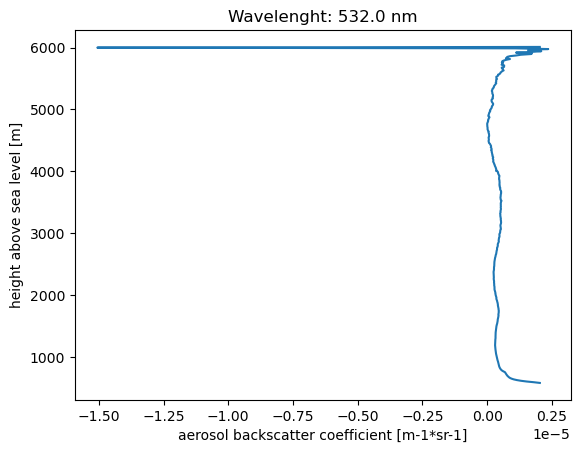

In [20]:
import matplotlib.pyplot as plt

indexes = np.where(ds2.backscatter.values[0][0]<=1e+36) # All values that are less than fill value for missing data

plt.figure()
plt.plot(ds2.backscatter.values[0][0][indexes],ds2.backscatter.altitude.values[indexes])
plt.ylabel('{} [{}]'.format(ds2.altitude.attrs['long_name'],ds2.altitude.attrs['units']))
plt.xlabel('{} [{}]'.format(ds2.backscatter.attrs['long_name'],ds2.backscatter.attrs['units']))
plt.title('Wavelenght: {} {}'.format(ds2.wavelength.values[0], ds2.wavelength.attrs['units']))

Text(0.5, 1.0, 'Wavelenght: 532.0 nm')

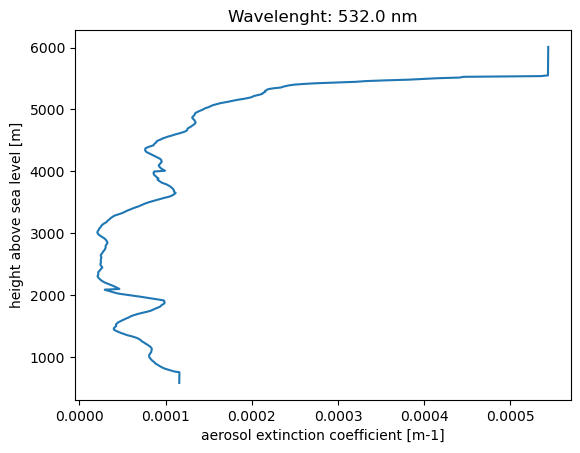

In [21]:
indexes = np.where(ds2.extinction.values[0][0]<=1e+36) # All values that are less than fill value for missing data

plt.figure()
plt.plot(ds2.extinction.values[0][0][indexes],ds2.altitude.values[indexes])
plt.ylabel('{} [{}]'.format(ds2.altitude.attrs['long_name'],ds2.altitude.attrs['units']))
plt.xlabel('{} [{}]'.format(ds2.extinction.attrs['long_name'],ds2.extinction.attrs['units']))
plt.title('Wavelenght: {} {}'.format(ds2.wavelength.values[0], ds2.wavelength.attrs['units']))